In [1]:
# Lucas Lukasavicus Silva
# PPG-PO (ITA/UNIFESP) - Modelagem de Investimento e Risco

# observação: Utilize o template abaixo para colocar os dados da sua anáiise. O Objetivo é montar a análise de uma carteira de investimento utilizando o material produzido em aula (ex. codigos do Python no Colab).
# Você poderá utilizadas dados de qualquer setor da economia, desde que realize uma análise condizente nas demais seçòes do trabalho. O que não pode é utilizar o mesmo conjunto de dados utilizado nas aulas. Você poderá fazer, por exemplo, uma análise setorial (ex. empresas de servicos, empresas de tecnologia etc.)


# Aplicação do Framework CAPM para Títulos de Fundos de Investimento Imobiliário (FIIs)

> O Framework CAPM tem como base a Teoria Moderna de Portifólios que determina que o risco de um portifólio deve ser menor ou igual ao risco de cada componente individual. A partir dessa observação é possível concluir que a diversificação pode ser uma boa estratégia para a redução do risco sistemico dos seus investimentos.
- Definição de risco sistemico e risco não-sistemico;
No presente trabalho buscamos utilizar esse framework para comparar 3 carteiras de invesimentos de fundos de investimentos imobiliários.
Fundos investimentos imobiliários são títulos de renda variável que investem em imóveis ou em papéis do mercado imobiliário.

# Introdução

# Revisão da Literatura

aqui você deverá fazer um breve apanhado da literatura baseado nos temas estudados em aula.

# Materiais e Dados Utilizados

Aqui você deverá descrever os dados utilizados e qual foi a forma de análise empregada.
Sugestão utilize perídos de no mínimo 5 anos.

Notebooks das aulas foram usados para essas análises:

[x] - [Analise de Dados das Ações (e visualização)](https://colab.research.google.com/drive/1FacYoypWhN0GcINRvB5twEjQOABJMNSc#scrollTo=uhW6OMmg5mGa)


[ ] - [Alocação dos Ativos na Carteira e Análise Estatística)](https://colab.research.google.com/drive/18MHexlXjpONCOvw-3R2ML3G8rIDtYpMY)


[ ] - [CAPM](https://colab.research.google.com/drive/1-CLXlAFzXAJAH3D2U9wiWjm5lfLNkrTW)


Para realizar as análises, coletamos os dados através de um _Web Crawler_ que obteve os dados do site [Fiis.com.br](https://fiis.com.br/).

### Web Crawler

In [34]:
import pandas as pd
import requests
import json
from datetime import datetime
import math

import matplotlib.pyplot as plt

# import numpy as np
import seaborn as sns
# from copy import copy
# from scipy import stats
import plotly.express as px
import plotly.figure_factory as ff
# import plotly.graph_objects as go

In [3]:
TOP10PORTFOLIO = [
    'KNIP11', 'KNCR11', 'HGLG11', 'KNRI11', 'IRDM11', 'XPLG11', 'MXRF11', 'XPML11', 'CPTS11', 'HGRU11'
]

LAST10PORTFOLIO = [
    'VCRI11', 'CYCR11', 'NCHB11', 'VSLH11', 'MORC11', 'SADI11', 'TORD11', 'ARRI11', 'JPPA11', 'CARE11'
]

In [4]:

URL = "https://fiis.com.br/wp-json/fiis/v1/funds"

headers={
    'User-Agent': 'Mozilla/5.0 (Windows NT 10.0; Win64; x64) AppleWebKit/537.36 (KHTML, like Gecko) Chrome/114.0.0.0 Safari/537.36',
    'Referer': 'https://fiis.com.br/vifi11/',

    'Accept': 'application/json, text/plain, */*',
    'Accept-Language': 'pt-BR,pt;q=0.9,en-US;q=0.8,en;q=0.7,es;q=0.6',
    'Cache-Control': 'no-cache',
    'Cookie' : '_gcl_au=1.1.1401315928.1687872863; _fbp=fb.2.1687872864000.1852345747; _hjSessionUser_1049683=eyJpZCI6IjlkYmIwMDEzLTRkZGItNWM4Yi05MTllLTllNmZlMzNmMmZiOSIsImNyZWF0ZWQiOjE2ODc4NzI4NjQ3ODMsImV4aXN0aW5nIjp0cnVlfQ==; hubspotutk=5bdace1cc6859174ccd86739f2c67904; __hs_opt_out=no; __hssrc=1; _gid=GA1.3.410425610.1689279073; popup=popup-fiis.com; __hstc=109538586.5bdace1cc6859174ccd86739f2c67904.1687872914435.1689279109575.1689282439215.5; _ga=GA1.1.40554755.1687872863; _hjIncludedInSessionSample_1049683=0; _hjSession_1049683=eyJpZCI6IjRiMzhlZjA4LTc1MjktNDllZi1iYzc0LTNmNGMxOTliYjliNCIsImNyZWF0ZWQiOjE2ODkzNDIyNjQzMTYsImluU2FtcGxlIjpmYWxzZX0=; _hjAbsoluteSessionInProgress=0; _ga_NFCXE4NETS=GS1.1.1689342169.8.1.1689342318.60.0.0',
    'Pragma': 'no-cache',
    'Sec-Ch-Ua': '"Not.A/Brand";v="8", "Chromium";v="114", "Google Chrome";v="114"',
    'Sec-Ch-Ua-Mobile': '?0',
    'Sec-Ch-Ua-Platform': '"Windows"',
    'Sec-Fetch-Dest': 'empty',
    'Sec-Fetch-Mode': 'cors',
    'Sec-Fetch-Site': 'same-origin',
    'User-Agent': 'Mozilla/5.0 (Windows NT 10.0; Win64; x64) AppleWebKit/537.36 (KHTML, like Gecko) Chrome/114.0.0.0 Safari/537.36',
    'X-Fiis-Nonce': '61495f60b533cc40ad822e054998a3190ea9bca0d94791a1da',
}


In [7]:
def crawl_fii(ticker):
  pass

def crawl_fii_quotes(ticker):
  url = f"{URL}/{ticker}/quotes"
  req = requests.get(url, headers=headers)

  assert req.status_code == 200, "Something went wrong with request"
  if(req.status_code != 200):
    print(req)
    raise Exception("Something bad happen")

  json_data_str = req.json()
  json_data = json.loads(json_data_str)
  json_data = json_data[0]
  quotes = json.loads(json_data['quotations'])

  # remove time from date
  for q  in quotes:
    q['date'] = datetime.strptime(q['date'][:8], "%d/%m/%y")

  return pd.DataFrame(quotes)


def crawl_fii_yields(ticker):
  url = f"{URL}/{ticker}/incomes"
  req = requests.get(url, headers=headers)

  assert req.status_code == 200, "Something went wrong with request"
  if(req.status_code != 200):
    print(req)
    raise Exception("Something bad happen")

  json_data_str = req.json()
  json_data = json.loads(json_data_str)
  incomes = json_data['incomes']

  # remove time from date
  format = '%Y-%m-%d'
  for i  in incomes:
    i['data_base'] = datetime.strptime(i['data_base'], format)
    i['data_pagamento'] = datetime.strptime(i['data_pagamento'], format)

  return pd.DataFrame(incomes)

def crawl_fii_data(ticker):
  q = crawl_fii_quotes(ticker)
  y = crawl_fii_yields(ticker)
  return q, y

In [8]:
## TESTE
ifix = pd.read_csv('IFIXDia_17-07-23.csv', header=1, encoding='latin1', sep=';', index_col=False)
ifix = ifix.drop(ifix.tail(2).index)

In [9]:
tickers = list(ifix['Código'])

In [10]:
# Given a set of tickers
# tickers = TOP10PORTFOLIO + LAST10PORTFOLIO

# 1. Crawl their data
# ==============================================================================
errs = []
data = []
for t in tickers:
  print(f"getting data for {t}")
  try:
    dfq, dfy = crawl_fii_data(t)
    data.append({
        'ticker' : t,
        'quotes' : dfq,
        'incomes': dfy
    })
  except Exception as e:
    errs.append({'step': 'crawl_fii_data', 'ticker' : t, 'err' : e})
# ++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++

getting data for CACR11
getting data for BPFF11
getting data for AFHI11
getting data for ALZR11
getting data for RZAT11
getting data for ARRI11
getting data for AIEC11
getting data for BARI11
getting data for BBPO11
getting data for BCFF11
getting data for BRCR11
getting data for BCIA11
getting data for BCRI11
getting data for BLMR11
getting data for BLMG11
getting data for BRCO11
getting data for BTAL11
getting data for BTCI11
getting data for BTRA11
getting data for BTLG11
getting data for CPFF11
getting data for CPTS11
getting data for HGCR11
getting data for HGFF11
getting data for HGLG11
getting data for HGRU11
getting data for CYCR11
getting data for CARE11
getting data for DEVA11
getting data for VRTA11
getting data for GTWR11
getting data for GGRC11
getting data for GALG11
getting data for HABT11
getting data for HCTR11
getting data for HGBS11
getting data for HGRE11
getting data for HSAF11
getting data for HSLG11
getting data for HSML11
getting data for HFOF11
getting data for

In [11]:
# 2. Join Data
# ==============================================================================
# Join Data for Prices
# Get a set of dates (to join all prices based on these dates)
dates = []
for d in data:
  dts = list(d['quotes']['date'].unique())
  dates = list(set(dates+dts))

prices_df = pd.DataFrame(dates, columns=['date']).sort_values(by= 'date')

for d in data:
  quotes = d['quotes']
  tckr = d['ticker']
  prices_df = pd.merge(prices_df, quotes, on='date', how='left') #, suffixes=('', f"_{data[0]['ticker']}"))
  prices_df[f"{tckr}_price"] = prices_df["price"]
  del prices_df["price"]

prices_df.set_index('date')
# ------------------------------------------------------------------------------
dates = []
for d in data:
  dts = list(d['incomes']['data_pagamento'].unique())
  dates = list(set(dates+dts))

incomes_df = pd.DataFrame(dates, columns=['data_pagamento']).sort_values(by= 'data_pagamento')

for d in data:
  incomes = d['incomes'][['data_pagamento', 'rendimento']]
  tckr = d['ticker']
  incomes_df = pd.merge(incomes_df, incomes, on='data_pagamento', how='left') #, suffixes=('', f"_{data[0]['ticker']}"))
  incomes_df[f"{tckr}_rendimento"] = incomes_df["rendimento"]
  del incomes_df["rendimento"]

incomes_df.set_index('data_pagamento')
# ++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++

<ipython-input-11-60503e4e811a>:16: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  prices_df[f"{tckr}_price"] = prices_df["price"]
<ipython-input-11-60503e4e811a>:16: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  prices_df[f"{tckr}_price"] = prices_df["price"]
<ipython-input-11-60503e4e811a>:16: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmente

,CACR11_rendimento,BPFF11_rendimento,AFHI11_rendimento,ALZR11_rendimento,RZAT11_rendimento,ARRI11_rendimento,AIEC11_rendimento,BARI11_rendimento,BBPO11_rendimento,BCFF11_rendimento,...,VINO11_rendimento,VISC11_rendimento,VTLT11_rendimento,WHGR11_rendimento,XPCI11_rendimento,XPIN11_rendimento,XPLG11_rendimento,XPML11_rendimento,XPPR11_rendimento,XPSF11_rendimento
data_pagamento,,,,,,,,,,,,,,,,,,,,,
2016-06-14,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2017-01-13,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.5400,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2017-01-24,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2017-02-07,NaN,0.6700,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2017-02-13,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2023-07-19,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2023-07-20,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2023-07-21,NaN,NaN,1.1000,NaN,0.9000,NaN,NaN,0.9350,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [12]:
# prices_df.shape
# incomes_df.shape
errs

[{'step': 'crawl_fii_data',
  'ticker': 'TRBL11',
  'err': IndexError('list index out of range')}]

In [13]:
# 3. Export Data
incomes_df.to_csv('incomes.csv')
prices_df.to_csv('prices.csv')

In [14]:
# 4. Import Data
from google.colab import drive

# if you do not want to execute the whole process, just run this part (be assure to upload the csvs files before proceding)
try:
  if((incomes_df == None) or (prices_df == None)):
    raise Exception('Empty dataframe(s)')
except:
  # Mount the drive
  drive.mount('/content/drive')
  incomes_df = pd.read_csv('incomes.csv')
  prices_df = pd.read_csv('prices.csv')


Mounted at /content/drive


In [15]:
prices_df.head(5)

,Unnamed: 0,date,CACR11_price,BPFF11_price,AFHI11_price,ALZR11_price,RZAT11_price,ARRI11_price,AIEC11_price,BARI11_price,...,VINO11_price,VISC11_price,VTLT11_price,WHGR11_price,XPCI11_price,XPIN11_price,XPLG11_price,XPML11_price,XPPR11_price,XPSF11_price
0,0,2018-07-16,NaN,90.20,NaN,94.00,NaN,NaN,NaN,NaN,...,NaN,102.19,NaN,NaN,NaN,NaN,96.30,99.48,NaN,NaN
1,1,2018-07-17,NaN,89.50,NaN,94.50,NaN,NaN,NaN,NaN,...,NaN,102.14,NaN,NaN,NaN,NaN,95.53,99.35,NaN,NaN
2,2,2018-07-18,NaN,92.80,NaN,92.51,NaN,NaN,NaN,NaN,...,NaN,102.50,NaN,NaN,NaN,NaN,95.20,99.00,NaN,NaN
3,3,2018-07-19,NaN,92.87,NaN,92.10,NaN,NaN,NaN,NaN,...,NaN,102.38,NaN,NaN,NaN,NaN,95.20,97.06,NaN,NaN
4,4,2018-07-20,NaN,91.30,NaN,92.65,NaN,NaN,NaN,NaN,...,NaN,102.36,NaN,NaN,NaN,NaN,95.00,98.22,NaN,NaN


In [16]:
incomes_df.head(5)

,Unnamed: 0,data_pagamento,CACR11_rendimento,BPFF11_rendimento,AFHI11_rendimento,ALZR11_rendimento,RZAT11_rendimento,ARRI11_rendimento,AIEC11_rendimento,BARI11_rendimento,...,VINO11_rendimento,VISC11_rendimento,VTLT11_rendimento,WHGR11_rendimento,XPCI11_rendimento,XPIN11_rendimento,XPLG11_rendimento,XPML11_rendimento,XPPR11_rendimento,XPSF11_rendimento
0,0,2016-06-14,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,1,2017-01-13,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,2,2017-01-24,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,3,2017-02-07,NaN,0.67,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,4,2017-02-13,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


### Análise de Dados

Nessa seção vamos analisar os dados coletados para ambas as carteiras baseadas no IFIX

In [17]:
# Quick data clean:
for col in prices_df.columns:
  if 'Unnamed' in col:
    del prices_df[col]

In [18]:
tickers = [c[:6] for c in prices_df.columns if '11' in c]
print(f"Fundos analisados: {len(tickers)}\n", tickers)

print("\n\n", "="*50)
display(prices_df.describe())

print("\n\n", "="*50)
display(prices_df.isnull().sum())

display(prices_df.info())

Fundos analisados: 110
 ['CACR11', 'BPFF11', 'AFHI11', 'ALZR11', 'RZAT11', 'ARRI11', 'AIEC11', 'BARI11', 'BBPO11', 'BCFF11', 'BRCR11', 'BCIA11', 'BCRI11', 'BLMR11', 'BLMG11', 'BRCO11', 'BTAL11', 'BTCI11', 'BTRA11', 'BTLG11', 'CPFF11', 'CPTS11', 'HGCR11', 'HGFF11', 'HGLG11', 'HGRU11', 'CYCR11', 'CARE11', 'DEVA11', 'VRTA11', 'GTWR11', 'GGRC11', 'GALG11', 'HABT11', 'HCTR11', 'HGBS11', 'HGRE11', 'HSAF11', 'HSLG11', 'HSML11', 'HFOF11', 'IRDM11', 'JPPA11', 'JSAF11', 'JSRE11', 'KISU11', 'KNRI11', 'KCRE11', 'KNHY11', 'KNIP11', 'KNCR11', 'KNSC11', 'KFOF11', 'LGCP11', 'MALL11', 'MCCI11', 'MCHF11', 'MXRF11', 'MFII11', 'MGFF11', 'MORC11', 'MORE11', 'NCHB11', 'OUJP11', 'PATL11', 'PLCR11', 'PORD11', 'QAGR11', 'RBRL11', 'RBRY11', 'RBRP11', 'RBRF11', 'RBRR11', 'RECR11', 'RECT11', 'RBFF11', 'RCRB11', 'RBVA11', 'RZAK11', 'RZTR11', 'SADI11', 'SARE11', 'SNCI11', 'SNFF11', 'TEPP11', 'TGAR11', 'TORD11', 'TRXF11', 'URPR11', 'VGHF11', 'VGIP11', 'VGIR11', 'CVBI11', 'LVBI11', 'PVBI11', 'VCJR11', 'VSLH11', 'VCRI

,CACR11_price,BPFF11_price,AFHI11_price,ALZR11_price,RZAT11_price,ARRI11_price,AIEC11_price,BARI11_price,BBPO11_price,BCFF11_price,...,VINO11_price,VISC11_price,VTLT11_price,WHGR11_price,XPCI11_price,XPIN11_price,XPLG11_price,XPML11_price,XPPR11_price,XPSF11_price
count,769.000000,1241.000000,570.000000,1241.000000,847.000000,912.000000,680.000000,977.000000,1241.000000,1241.000000,...,901.000000,1241.000000,1116.000000,280.000000,888.000000,1178.000000,1241.000000,1241.000000,894.000000,848.000000
mean,105.963537,81.733844,96.508386,113.384142,380.552279,9.262829,78.004794,100.599550,118.698122,80.315600,...,54.124395,108.241096,101.672061,9.096107,91.421768,102.157334,107.132442,104.148380,63.516868,8.315342
std,4.669363,16.327078,3.048309,11.846280,456.386257,0.824589,10.043311,9.547873,26.754831,11.872092,...,7.705589,9.811307,9.741579,0.601610,7.183139,21.824214,12.930532,10.937042,23.453562,1.070571
min,95.000000,57.650000,90.200000,83.510000,82.890000,5.400000,59.480000,76.710000,78.110000,60.850000,...,38.790000,72.300000,83.200000,8.190000,65.520000,67.710000,86.570000,68.300000,22.250000,6.670000
25%,103.070000,66.840000,93.962500,105.900000,99.895000,8.840000,71.007500,95.810000,90.730000,69.500000,...,47.480000,101.980000,93.000000,8.520000,86.020000,82.935000,97.000000,97.050000,46.442500,7.270000
50%,105.590000,79.750000,96.130000,114.250000,106.310000,9.300000,78.295000,102.590000,116.100000,82.400000,...,55.210000,106.850000,100.215000,9.070000,92.450000,107.200000,103.250000,103.450000,65.655000,8.015000
75%,108.000000,92.260000,99.000000,121.690000,999.995000,9.872500,85.570000,107.500000,139.500000,89.480000,...,60.080000,111.990000,111.112500,9.600000,96.702500,115.700000,115.000000,108.020000,80.262500,9.560000
max,119.490000,130.340000,107.000000,148.990000,1349.990000,11.370000,99.000000,116.290000,171.600000,118.000000,...,72.500000,145.000000,127.480000,10.490000,106.770000,207.000000,152.500000,147.000000,127.640000,10.330000


date              0
CACR11_price    472
BPFF11_price      0
AFHI11_price    671
ALZR11_price      0
               ... 
XPIN11_price     63
XPLG11_price      0
XPML11_price      0
XPPR11_price    347
XPSF11_price    393
Length: 111, dtype: int64

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1241 entries, 0 to 1240
Columns: 111 entries, date to XPSF11_price
dtypes: float64(110), object(1)
memory usage: 1.1+ MB


None

In [19]:
def show_plot(df, fig_title):
  df.plot(x="date",figsize=(15,7), linewidth=3, title=fig_title)
  plt.grid()
  plt.show()

def normalize(df):
  x=df.copy()

  for i in x.columns[1:]:
    x[i]=x[i]/x[i][0]
  return x

In [20]:
def interactive_plot(df, title):
  fig=px.line(title =title)
  for i in df.columns[1:]:
    fig.add_scatter(x=df["date"], y=df[i], name=i)

  fig.show()

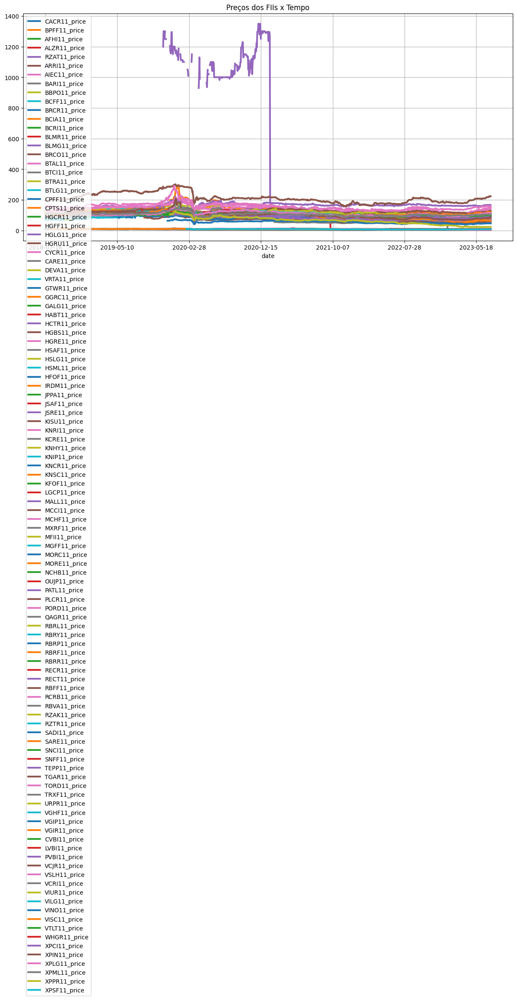

In [21]:
show_plot(prices_df, 'Preços dos FIIs x Tempo')

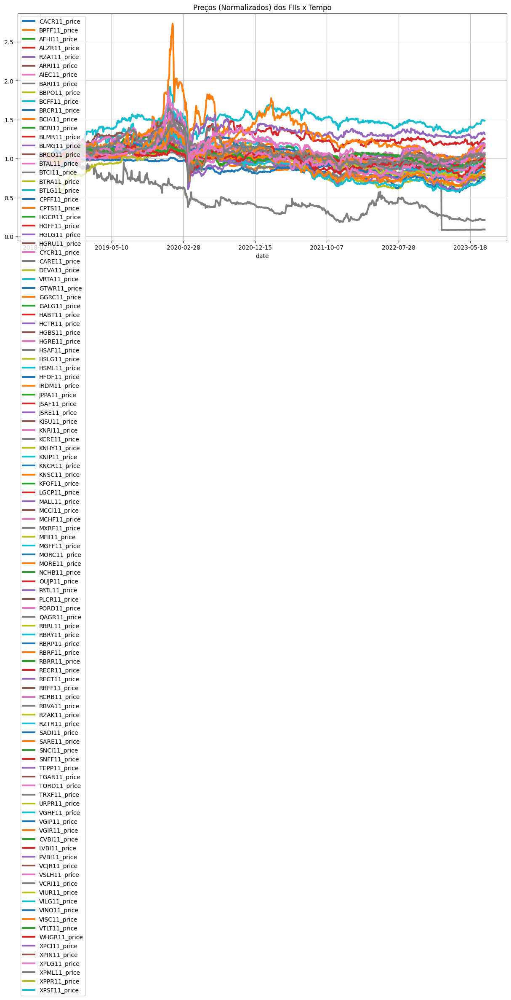

In [22]:
show_plot(normalize(prices_df), 'Preços (Normalizados) dos FIIs x Tempo')

In [23]:
# Plot interactive chart
interactive_plot(prices_df, "Preços (Gráfico Interativo)")

In [24]:
# Plot interactive (normalized) chart
interactive_plot(normalize(prices_df), "Preços Normalizados (Gráfico Interativo)")

In [25]:
# Let's define a function to calculate stocks daily returns (for all stocks)
def daily_return(df):
  df_daily_return=df.copy()

  for i in df.columns[1:]:
    for j in range(1, len(df)):
      df_daily_return[i][j]=((df[i][j]-df[i][j-1])/df[i][j-1])*100
    df_daily_return[i][0]=0
  return df_daily_return


In [26]:
# Get the daily returns
prices_daily_return=daily_return(prices_df)

In [27]:
prices_daily_return

,date,CACR11_price,BPFF11_price,AFHI11_price,ALZR11_price,RZAT11_price,ARRI11_price,AIEC11_price,BARI11_price,BBPO11_price,...,VINO11_price,VISC11_price,VTLT11_price,WHGR11_price,XPCI11_price,XPIN11_price,XPLG11_price,XPML11_price,XPPR11_price,XPSF11_price
0,2018-07-16,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
1,2018-07-17,NaN,-0.776053,NaN,0.531915,NaN,NaN,NaN,NaN,0.597296,...,NaN,-0.048928,NaN,NaN,NaN,NaN,-0.799585,-0.130680,NaN,NaN
2,2018-07-18,NaN,3.687151,NaN,-2.105820,NaN,NaN,NaN,NaN,-0.664062,...,NaN,0.352457,NaN,NaN,NaN,NaN,-0.345441,-0.352290,NaN,NaN
3,2018-07-19,NaN,0.075431,NaN,-0.443195,NaN,NaN,NaN,NaN,0.275265,...,NaN,-0.117073,NaN,NaN,NaN,NaN,0.000000,-1.959596,NaN,NaN
4,2018-07-20,NaN,-1.690535,NaN,0.597177,NaN,NaN,NaN,NaN,1.019608,...,NaN,-0.019535,NaN,NaN,NaN,NaN,-0.210084,1.195137,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1236,2023-07-10,0.132878,-0.115757,0.561855,1.275576,-0.641689,-0.448430,-0.055571,-0.188368,-0.102249,...,0.494092,-0.091309,0.518672,0.529661,-3.934501,0.296736,-0.385289,0.268714,-0.606586,-1.326900
1237,2023-07-11,0.075829,0.724323,0.639984,0.211327,0.979167,0.225225,-2.029469,-0.330267,-0.204708,...,-0.470286,0.681289,-0.908153,-0.105374,0.449811,-0.047337,0.290084,0.009571,-0.087184,0.244499
1238,2023-07-12,-0.265202,-0.071911,0.292722,-0.556727,0.041263,0.224719,0.751986,0.236686,-0.492308,...,-0.837629,-0.255818,0.760258,0.210970,0.506717,-1.124793,-0.166535,-0.468944,-0.218150,0.243902
1239,2023-07-13,-0.218424,0.561313,-0.613929,-0.127237,0.020623,-0.784753,-0.028165,0.330579,0.278293,...,-1.342863,0.066187,0.661499,-0.631579,0.809005,0.107772,0.000000,0.096154,0.306078,-0.364964


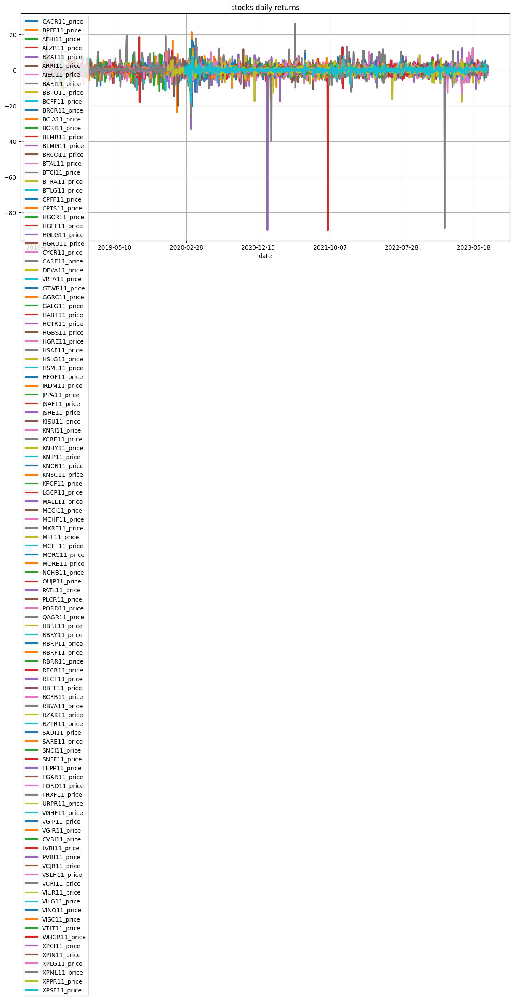

In [28]:
show_plot(prices_daily_return, "stocks daily returns")

In [29]:
interactive_plot(prices_daily_return, "stocks daily returns")

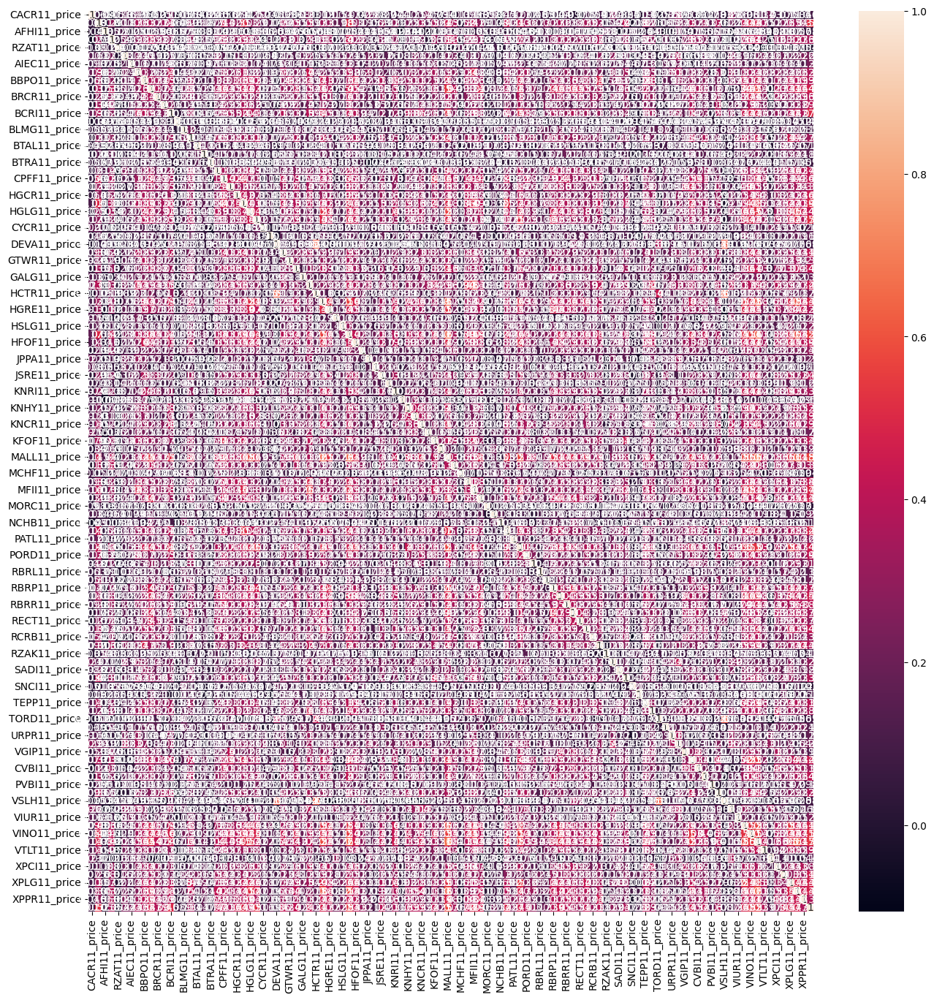

In [30]:
# Daily Return Correlation
cm = prices_daily_return.drop(columns=["date"]).corr()
plt.figure(figsize=(16,16))
ax=plt.subplot()
sns.heatmap(cm, annot=True);

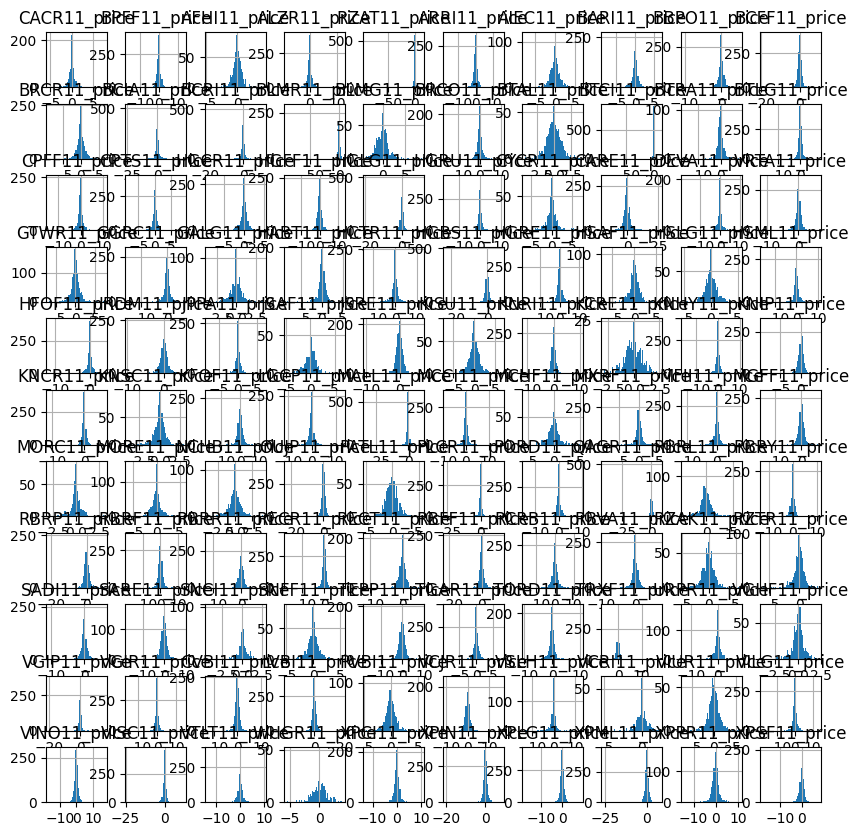

In [31]:
prices_daily_return.hist(figsize=(10,10),bins=50);

In [32]:
# Group all data returns together in a list
# Make a copy of the daily returns dataframe
df_hist=prices_daily_return.copy()

df_hist=prices_daily_return.drop(columns=["date"])
data=[]

df_hist = df_hist.fillna(0)

for i in df_hist.columns:
  data.append(prices_daily_return[i].values)


In [33]:
data_without_nan = []
for d in data:
  dd = [(0 if(math.isnan(di)) else di) for di in d]
  data_without_nan.append(dd)

NameError: ignored

In [ ]:
# for d in data:
# data[0].replace(np.nan, 0)
import numpy as np
# np.nan in data[18]
vector = data_without_nan[18][:5]

In [ ]:
import math
vector

In [ ]:
fig = ff.create_distplot(data_without_nan, df_hist.columns)
fig.show();

#### Economical Data Analysis:

> TODO:

- [ ] Index Calculation;
- [ ] Allocation;
- [ ] Portfolio Daily Return;
- [ ] Portfolio Worth Calculation;
- [ ] Portfolio Data Viz;
- [ ] Portfolio Statistical Metrics:
  - [ ] CUMMULATIVE RETURN;
  - [ ] AVERAGE DAILY RETURN;
  -[ ] SHARPE RATIO
  
---

#### CAPM:

> TODO:

- [ ] Calculate beta for a single asset (demo);
- [ ] Apply CAPM for a single asset;
- [ ] Calculate beta for all assets;
- [ ] Calculate beta for a portfolio;

---

#### Wrap Up:

> TODO:

- [ ] Copy notebook;
- [ ] Write intro;
- [ ] Write Resume;
- [ ] Clean code cells;
- [ ] Get 2 different portfolios to run the analysis;
- [ ] Write Conclusions;

# Resultados

Aqui você deverá incluir os resultados produzidos pela análise bem como os gráficos, tabelas e resultados numericos obtidos após a análise.

# Discussão e Limitações da Pesquisa

# Bibliografia Utilizada